<a href="https://colab.research.google.com/drive/1kap8M_iWcX8t1sjoljCT_3V_tj5wGKYs?usp=sharing" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab"/></a>

## Image and patch generation functions

3 good berries and 41 bad berries simulated


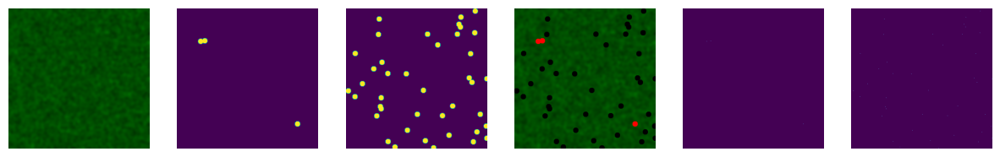

In [101]:
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import scipy.ndimage as ndimage
from skimage import draw

FULL_IMG_WIDTH = 512
FULL_IMG_HEIGHT = 512
IMG_CHANNELS = 3
PATCH_WIDTH = 32
PATCH_HEIGHT = 32
INPUT_WIDTH = PATCH_WIDTH*2
INPUT_HEIGHT = PATCH_HEIGHT*2

def generate_image(with_intermediates=False):
  # the image has a random greenish background that is smoothed
  backgr = np.zeros([FULL_IMG_HEIGHT, FULL_IMG_WIDTH, IMG_CHANNELS])
  backgr[ np.random.rand(FULL_IMG_HEIGHT, FULL_IMG_WIDTH) < 0.3, 1 ] = 1
  backgr = ndimage.gaussian_filter(backgr, sigma=(5, 5, 0), order=0)

  # between 0 and 75 good berries randomly placed
  num_good_berries = np.random.randint(0, 75)
  good_berry_cx = np.random.randint(0, FULL_IMG_WIDTH, size=num_good_berries)
  good_berry_cy = np.random.randint(0, FULL_IMG_HEIGHT, size=num_good_berries)
  label_good = np.zeros([FULL_IMG_WIDTH, FULL_IMG_HEIGHT])
  label_good[good_berry_cx, good_berry_cy] = 1

  # between 0 and 75 bad berries randomly placed
  num_bad_berries = np.random.randint(0, 75)
  bad_berry_cx = np.random.randint(0, FULL_IMG_WIDTH, size=num_bad_berries)
  bad_berry_cy = np.random.randint(0, FULL_IMG_HEIGHT, size=num_bad_berries)
  label_bad = np.zeros([FULL_IMG_WIDTH, FULL_IMG_HEIGHT])
  label_bad[bad_berry_cx, bad_berry_cy] = 1

  # draw the good berries which are 10 px in radius
  good_berries = np.zeros([FULL_IMG_HEIGHT, FULL_IMG_WIDTH])
  for idx in range(len(good_berry_cx)):
    rr, cc = draw.disk((good_berry_cx[idx], good_berry_cy[idx]),
                         radius=10,
                         shape=good_berries.shape)
    good_berries[rr, cc] = 1

  # draw the bad berries which are 10 px in radius
  bad_berries = np.zeros([FULL_IMG_HEIGHT, FULL_IMG_WIDTH])
  for idx in range(len(bad_berry_cx)):
    rr, cc = draw.disk((bad_berry_cx[idx], bad_berry_cy[idx]),
                         radius=10,
                         shape=bad_berries.shape)
    bad_berries[rr, cc] = 1

  # add berries to the background
  img = np.copy(backgr)
  img[good_berries > 0] = [1, 0, 0] # red
  img[bad_berries > 0] = [0, 0, 0] # black

  if with_intermediates:
    print("{} good berries".format(num_good_berries), "and {} bad berries simulated".format(num_bad_berries))
    return backgr, good_berries, bad_berries, img, label_good, label_bad
  else:
    return img, label_good, label_bad

images = generate_image(True)
f, ax = plt.subplots(1, len(images), figsize=(15, 5))
for idx, img in enumerate(images):
  ax[idx].imshow(img)
  ax[idx].axis('off')

In [102]:
## given an image, get the patches
def get_patches(img, label_good, label_bad, verbose=False):
  img = tf.expand_dims(img, axis=0)
  label_good = tf.expand_dims(tf.expand_dims(label_good, axis=0), axis=-1)
  label_bad = tf.expand_dims(tf.expand_dims(label_bad, axis=0), axis=-1)
  if verbose:
    print(img.shape, label_good.shape, label_bad.shape)
  num_patches = (FULL_IMG_HEIGHT // PATCH_HEIGHT)**2
  patches = tf.image.extract_patches(img,
                                     sizes=[1, INPUT_HEIGHT, INPUT_WIDTH, 1],
                                     strides=[1, PATCH_HEIGHT, PATCH_WIDTH, 1],
                                     rates=[1, 1, 1, 1],
                                     padding='SAME',
                                     name='get_patches')
  patches = tf.reshape(patches, [num_patches, -1])
  labels_good = tf.image.extract_patches(label_good,
                                    sizes=[1, PATCH_HEIGHT, PATCH_WIDTH, 1],
                                    strides=[1, PATCH_HEIGHT, PATCH_WIDTH, 1],
                                    rates=[1, 1, 1, 1],
                                    padding='VALID',
                                    name='get_labels_good')
  labels_good = tf.reshape(labels_good, [num_patches, -1])
  labels_bad = tf.image.extract_patches(label_bad,
                                    sizes=[1, PATCH_HEIGHT, PATCH_WIDTH, 1],
                                    strides=[1, PATCH_HEIGHT, PATCH_WIDTH, 1],
                                    rates=[1, 1, 1, 1],
                                    padding='VALID',
                                    name='get_labels_bad')
  labels_bad = tf.reshape(labels_bad, [num_patches, -1])
  # the "density" is the number of points in the label patch
  patch_labels_good = tf.math.reduce_sum(labels_good, axis=[1], name='calc_density_good')
  patch_labels_bad = tf.math.reduce_sum(labels_bad, axis=[1], name='calc_density_bad')
  if verbose:
    print(patches.shape, labels_good.shape, labels_bad.shape, patch_labels_good.shape, patch_labels_bad.shape)
  return patches, patch_labels_good, patch_labels_bad

## Train a regression model to predict density

In [103]:
# Getting input data
def create_dataset(num_full_images):
  def generate_patches():
    for i in range(num_full_images):
      img, label_good, label_bad = generate_image()
      patches, patch_label_good, patch_label_bad = get_patches(img, label_good, label_bad)
      # print(len(patches) * num_full_images)
      for patch, patch_label_good, patch_label_bad in zip(patches, patch_label_good, patch_label_bad):
        yield patch, patch_label_good, patch_label_bad

  return tf.data.Dataset.from_generator(
    generate_patches,
    (tf.float32, tf.float32, tf.float32), # patch, patch_label_good, patch_label_bad
    (tf.TensorShape([INPUT_HEIGHT*INPUT_WIDTH*IMG_CHANNELS]),
    tf.TensorShape([]), tf.TensorShape([]))
  )

trainds = create_dataset(1) # will create 256 patches per image
for img, label_good, label_bad in trainds.take(3):
  avg = tf.math.reduce_mean(img) # avg pixel in image
  print(img.shape, label_good.numpy(), label_bad.numpy(), avg.numpy())

(12288,) 0.0 0.0 0.074515216
(12288,) 1.0 0.0 0.09499564
(12288,) 0.0 0.0 0.076338835


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_4 (Reshape)         (None, 64, 64, 3)         0         
                                                                 
 conv2d_12 (Conv2D)          (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 31, 31, 32)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 29, 29, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 14, 14, 64)       0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 12, 12, 64)       

2400/2400 [==============================] - 406s 169ms/step - loss: 0.0049 - mse: 0.0294 - mae: 0.0704 - val_loss: 0.0035 - val_mse: 0.0155 - val_mae: 0.0475
Epoch 2/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0025 - mse: 0.0155 - mae: 0.0480

2400/2400 [==============================] - 405s 169ms/step - loss: 0.0025 - mse: 0.0155 - mae: 0.0480 - val_loss: 0.0016 - val_mse: 0.0080 - val_mae: 0.0310
Epoch 3/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0020 - mse: 0.0118 - mae: 0.0403

2400/2400 [==============================] - 408s 170ms/step - loss: 0.0020 - mse: 0.0118 - mae: 0.0403 - val_loss: 8.9738e-04 - val_mse: 0.0062 - val_mae: 0.0329
Epoch 4/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0019 - mse: 0.0103 - mae: 0.0384

2400/2400 [==============================] - 409s 170ms/step - loss: 0.0019 - mse: 0.0103 - mae: 0.0384 - val_loss: 8.4677e-04 - val_mse: 0.0035 - val_mae: 0.0176
Epoch 5/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0014 - mse: 0.0082 - mae: 0.0337

2400/2400 [==============================] - 404s 168ms/step - loss: 0.0014 - mse: 0.0082 - mae: 0.0337 - val_loss: 0.0011 - val_mse: 0.0076 - val_mae: 0.0309
Epoch 6/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0015 - mse: 0.0082 - mae: 0.0334

2400/2400 [==============================] - 406s 169ms/step - loss: 0.0015 - mse: 0.0082 - mae: 0.0334 - val_loss: 0.0017 - val_mse: 0.0067 - val_mae: 0.0286
Epoch 7/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0015 - mse: 0.0096 - mae: 0.0368

2400/2400 [==============================] - 406s 169ms/step - loss: 0.0015 - mse: 0.0096 - mae: 0.0368 - val_loss: 0.0014 - val_mse: 0.0051 - val_mae: 0.0280
Epoch 8/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0015 - mse: 0.0071 - mae: 0.0318

2400/2400 [==============================] - 410s 171ms/step - loss: 0.0015 - mse: 0.0071 - mae: 0.0318 - val_loss: 0.0016 - val_mse: 0.0077 - val_mae: 0.0309
Epoch 9/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0012 - mse: 0.0066 - mae: 0.0302

2400/2400 [==============================] - 410s 171ms/step - loss: 0.0012 - mse: 0.0066 - mae: 0.0302 - val_loss: 0.0010 - val_mse: 0.0075 - val_mae: 0.0328
Epoch 10/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0013 - mse: 0.0075 - mae: 0.0329

2400/2400 [==============================] - 411s 171ms/step - loss: 0.0013 - mse: 0.0075 - mae: 0.0329 - val_loss: 0.0011 - val_mse: 0.0039 - val_mae: 0.0213
Epoch 11/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0013 - mse: 0.0067 - mae: 0.0301

2400/2400 [==============================] - 409s 170ms/step - loss: 0.0013 - mse: 0.0067 - mae: 0.0301 - val_loss: 5.2769e-04 - val_mse: 0.0055 - val_mae: 0.0309
Epoch 12/20
2400/2400 [==============================] - ETA: 0s - loss: 8.0535e-04 - mse: 0.0055 - mae: 0.0262

2400/2400 [==============================] - 405s 169ms/step - loss: 8.0535e-04 - mse: 0.0055 - mae: 0.0262 - val_loss: 0.0010 - val_mse: 0.0053 - val_mae: 0.0314
Epoch 13/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0012 - mse: 0.0066 - mae: 0.0301

2400/2400 [==============================] - 404s 168ms/step - loss: 0.0012 - mse: 0.0066 - mae: 0.0301 - val_loss: 7.0739e-04 - val_mse: 0.0054 - val_mae: 0.0303
Epoch 14/20
2400/2400 [==============================] - ETA: 0s - loss: 9.3534e-04 - mse: 0.0059 - mae: 0.0282

2400/2400 [==============================] - 405s 169ms/step - loss: 9.3534e-04 - mse: 0.0059 - mae: 0.0282 - val_loss: 0.0020 - val_mse: 0.0192 - val_mae: 0.0509
Epoch 15/20
2400/2400 [==============================] - ETA: 0s - loss: 7.8060e-04 - mse: 0.0048 - mae: 0.0254

2400/2400 [==============================] - 403s 168ms/step - loss: 7.8060e-04 - mse: 0.0048 - mae: 0.0254 - val_loss: 3.6756e-04 - val_mse: 0.0033 - val_mae: 0.0270
Epoch 16/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0011 - mse: 0.0059 - mae: 0.0300

2400/2400 [==============================] - 429s 179ms/step - loss: 0.0011 - mse: 0.0059 - mae: 0.0300 - val_loss: 6.5989e-04 - val_mse: 0.0040 - val_mae: 0.0241
Epoch 17/20
2400/2400 [==============================] - ETA: 0s - loss: 8.4306e-04 - mse: 0.0052 - mae: 0.0270

2400/2400 [==============================] - 407s 169ms/step - loss: 8.4306e-04 - mse: 0.0052 - mae: 0.0270 - val_loss: 7.6847e-04 - val_mse: 0.0055 - val_mae: 0.0326
Epoch 18/20
2400/2400 [==============================] - ETA: 0s - loss: 9.2731e-04 - mse: 0.0057 - mae: 0.0280

2400/2400 [==============================] - 407s 170ms/step - loss: 9.2731e-04 - mse: 0.0057 - mae: 0.0280 - val_loss: 5.9385e-04 - val_mse: 0.0040 - val_mae: 0.0244
Epoch 19/20
2400/2400 [==============================] - ETA: 0s - loss: 8.2551e-04 - mse: 0.0052 - mae: 0.0264

2400/2400 [==============================] - 401s 167ms/step - loss: 8.2551e-04 - mse: 0.0052 - mae: 0.0264 - val_loss: 8.2306e-04 - val_mse: 0.0043 - val_mae: 0.0169
Epoch 20/20
2400/2400 [==============================] - ETA: 0s - loss: 0.0012 - mse: 0.0056 - mae: 0.0283

2400/2400 [==============================] - 403s 168ms/step - loss: 0.0012 - mse: 0.0056 - mae: 0.0283 - val_loss: 6.7498e-04 - val_mse: 0.0040 - val_mae: 0.0269


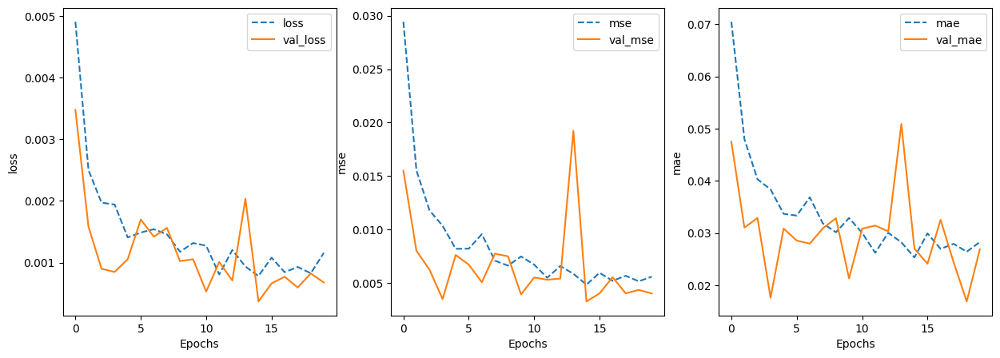

In [104]:
# Train
NUM_TRAIN = 300 # 10000 more realistic
NUM_EVAL = 20 # 1000 more realistic
NUM_EPOCHS = 20

def training_plot(metrics, history):
  f, ax = plt.subplots(1, len(metrics), figsize=(5*len(metrics), 5))
  for idx, metric in enumerate(metrics):
    ax[idx].plot(history.history[metric], ls='dashed')
    ax[idx].set_xlabel("Epochs")
    ax[idx].set_ylabel(metric)
    ax[idx].plot(history.history['val_' + metric]);
    ax[idx].legend([metric, 'val_' + metric])

def train_and_evaluate(batch_size = 32,
                       lrate = 0.001, # default in Adam constructor
                       l1 = 0,
                       l2 = 0,
                       num_filters = 32):
  regularizer = tf.keras.regularizers.l1_l2(l1, l2)
  train_dataset = create_dataset(NUM_TRAIN).batch(batch_size)
  eval_dataset = create_dataset(NUM_EVAL).batch(64)

  # a simple convnet. you can make it more complex, of course
  # the patch is flattened, so we start by reshaping to an image
  model = tf.keras.Sequential([
              tf.keras.layers.Reshape([INPUT_HEIGHT, INPUT_WIDTH, IMG_CHANNELS],
                                      input_shape=[INPUT_WIDTH * INPUT_HEIGHT * IMG_CHANNELS]),
              tf.keras.layers.Conv2D(num_filters, (3,3), activation='relu'),
              tf.keras.layers.MaxPooling2D((2, 2)),
              tf.keras.layers.Conv2D(num_filters*2, (3,3), activation='relu'),
              tf.keras.layers.MaxPooling2D((2, 2)),
              tf.keras.layers.Conv2D(num_filters*2, (3,3), activation='relu'),
              tf.keras.layers.Flatten(),
              tf.keras.layers.Dense(num_filters*2,
                                    kernel_regularizer=regularizer,
                                    activation=tf.keras.activations.relu),
              tf.keras.layers.Dense(1, activation='linear')
  ])
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lrate),
                  loss=tf.keras.losses.mean_squared_error,
                  metrics=['mse', 'mae'])
  print(model.summary())
  history = model.fit(train_dataset, validation_data=eval_dataset, epochs=NUM_EPOCHS)
  training_plot(['loss', 'mse', 'mae'], history)
  return model

model = train_and_evaluate()

58 good berries and 57 bad berries simulated
8/8 [==============================] - 0s 37ms/step
0 good berries and 40 bad berries simulated
8/8 [==============================] - 0s 37ms/step
57 good berries and 10 bad berries simulated
8/8 [==============================] - 0s 36ms/step
41 good berries and 29 bad berries simulated
8/8 [==============================] - 0s 37ms/step
21 good berries and 0 bad berries simulated
8/8 [==============================] - 0s 55ms/step
35 good berries and 4 bad berries simulated
8/8 [==============================] - 0s 57ms/step
36 good berries and 64 bad berries simulated
8/8 [==============================] - 0s 37ms/step
72 good berries and 70 bad berries simulated
8/8 [==============================] - 0s 35ms/step
3 good berries and 63 bad berries simulated
8/8 [==============================] - 0s 36ms/step
50 good berries and 31 bad berries simulated
8/8 [==============================] - 0s 36ms/step
17 good berries and 21 bad berries

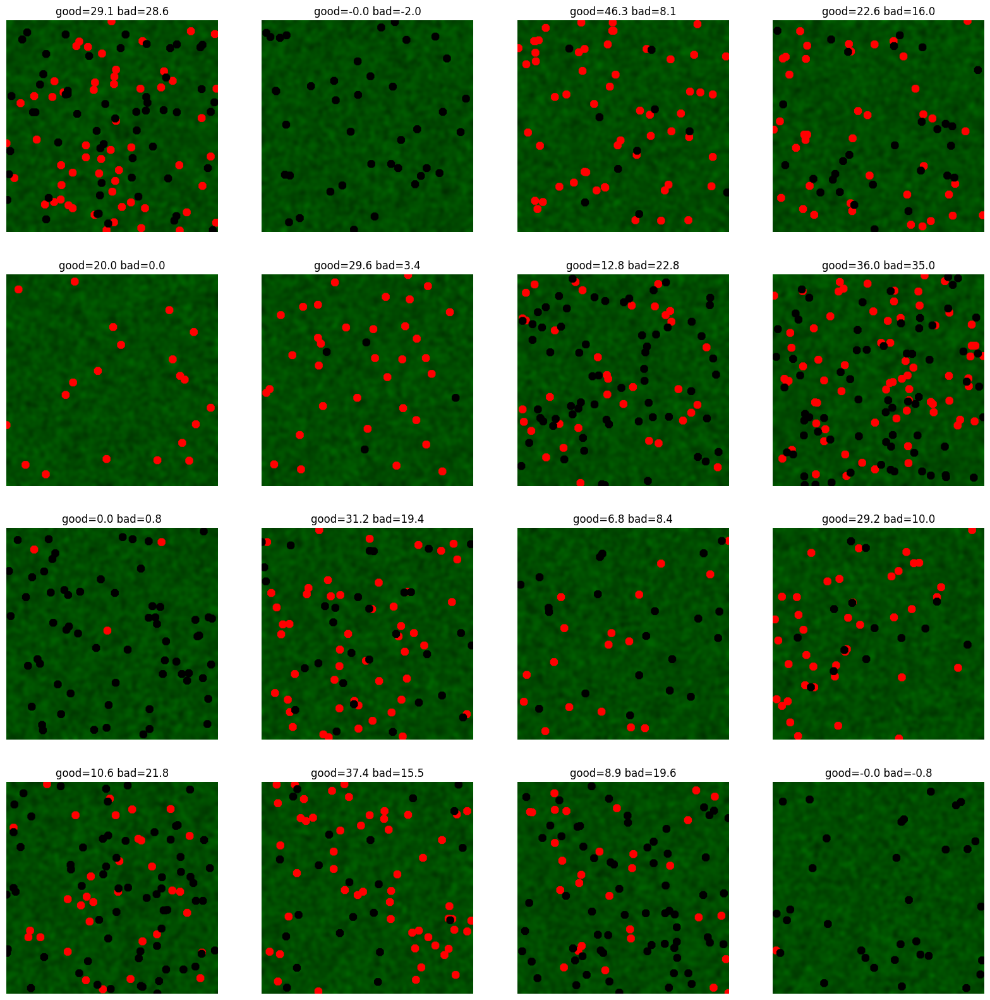

In [105]:
## prediction.
def count_berries(model, img):
  num_patches = (FULL_IMG_HEIGHT // PATCH_HEIGHT)**2
  img = tf.expand_dims(img, axis=0)
  patches = tf.image.extract_patches(img,
                sizes=[1, INPUT_HEIGHT, INPUT_WIDTH, 1],
                strides=[1, PATCH_HEIGHT, PATCH_WIDTH, 1],
                rates=[1, 1, 1, 1],
                padding='SAME',
                name='get_patches')
  patches = tf.reshape(patches, [num_patches, -1])
  densities = model.predict(patches)
  return tf.reduce_sum(densities)

# use an example image
f, ax = plt.subplots(4, 4, figsize=(20, 20))
for idx in range(16):
  backgr, berries, bad_berries, img, label_good, label_bad = generate_image(True)
  ax[idx//4, idx%4].imshow(img)
  ax[idx//4, idx%4].set_title("good={:.1f} bad={:.1f}".format(
    (count_berries(model, img).numpy())*(tf.reduce_sum(label_good).numpy())/(tf.reduce_sum(label_good).numpy()+tf.reduce_sum(label_bad).numpy()),
    (count_berries(model, img).numpy())*(tf.reduce_sum(label_bad).numpy())/(tf.reduce_sum(label_good).numpy()+tf.reduce_sum(label_bad).numpy())
  ))
  ax[idx//4, idx%4].axis('off')

## Actual image

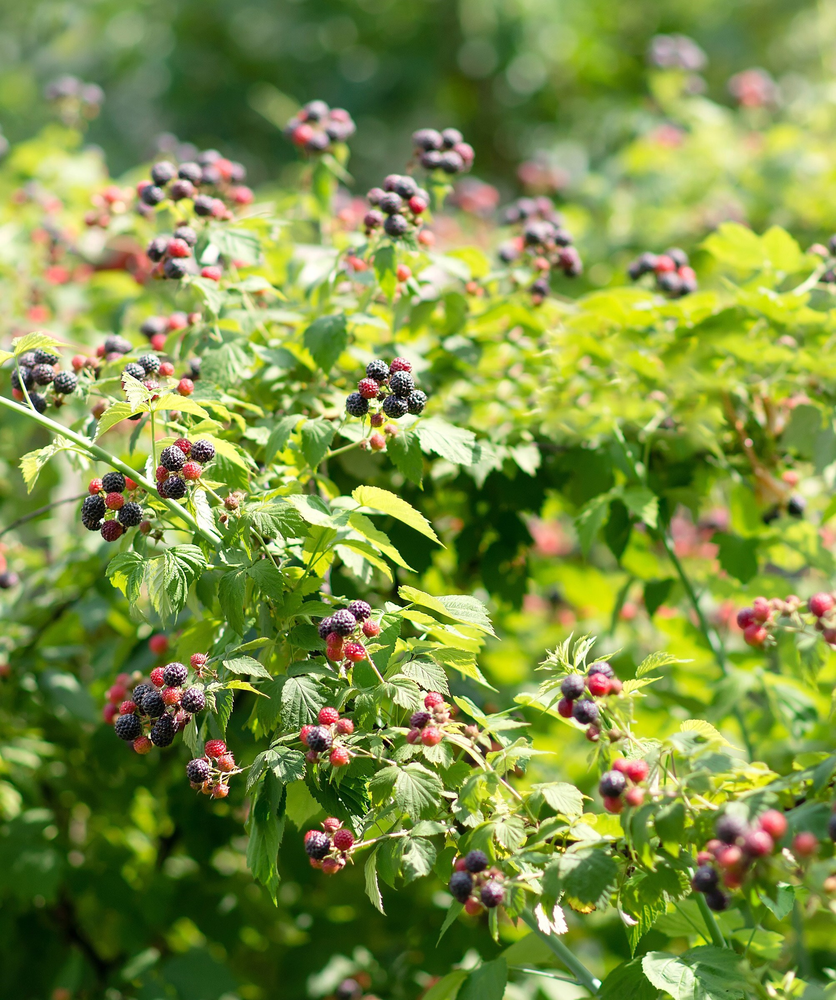

In [106]:
import requests
from io import BytesIO
from PIL import Image
url = 'https://raw.githubusercontent.com/DavidGomezCamargo/CS634-Data-Mining-Assignment3/0be539ee08bfd339a2570f2e42653caf81f32fb5/berries2.jpg'
page = requests.get(url)
berries2 = Image.open(BytesIO(page.content))
berries2

In [107]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Colab Notebooks/CS634
!file berries2.jpg

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Colab Notebooks/CS634
berries2.jpg: JPEG image data, JFIF standard 1.01, resolution (DPI), density 300x300, segment length 16, baseline, precision 8, 2006x2397, components 3


In [108]:
contents = tf.io.read_file('./berries2.jpg')
img = tf.image.decode_image(contents)
img = tf.image.resize(img, [FULL_IMG_WIDTH, FULL_IMG_HEIGHT])
n = count_berries(model, img)
print(n.numpy())

8/8 [==============================] - 1s 60ms/step
2679.624
